# Training

In [5]:
!pip uninstall -y opencv-python opencv-contrib-python
!pip install opencv-python-headless

Found existing installation: opencv-python 4.11.0.86
Uninstalling opencv-python-4.11.0.86:
  Successfully uninstalled opencv-python-4.11.0.86
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.0/50.0 MB 8.7 MB/s eta 0:00:00

[notice] A new release of pip is available: 23.1.2 -> 25.0.1
[notice] To update, run: pip install --upgrade pip


In [3]:
!pip install ultralytics
!apt-get update && apt-get install -y libgl1-mesa-glx
!pip install opencv-headless


[notice] A new release of pip is available: 23.1.2 -> 25.0.1
[notice] To update, run: pip install --upgrade pip

E: Could not open lock file /var/lib/apt/lists/lock - open (13: Permission denied)
E: Unable to lock directory /var/lib/apt/lists/


# Quick Training for a Few Epochs
This cell initializes a YOLOv8 nano model and trains it for a small number of epochs (e.g., 5) to quickly verify your setup.

In [57]:
from ultralytics import YOLO

# Initialize the smallest YOLO model (YOLOv8n)
model = YOLO("yolo11n.pt")

# Train for a few epochs (quick test run)
model.train(
    data="dataset.yaml",  # YAML file with dataset info
    epochs=50,             # Few epochs for a quick test
    imgsz=640,            # Input image size
    batch=16              # Batch size (adjust if needed)
)

train: Scanning /data/notebook_files/datasets/dataset/labels/train.cache... 1200 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1200/1200 [00:00<?, ?it/s]
val: Scanning /data/notebook_files/datasets/dataset/labels/val.cache... 300 images, 0 backgrounds, 0 corrupt: 100%|██████████| 300/300 [00:00<?, ?it/s]
       1/15      4.04G      1.281      6.464      1.142         25        640: 100%|██████████| 75/75 [00:13<00:00,  5.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  7.00it/s]
       2/15      4.31G     0.8338      1.804     0.9633         25        640: 100%|██████████| 75/75 [00:14<00:00,  5.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  9.56it/s]
       3/15      4.31G     0.7528      1.117     0.9485         30        640: 100%|██████████| 75/75 [00:12<00:00,  5.83it/s]
                 Class     Image

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x724686dc5570>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,   

In [61]:
models = ["yolo11n.pt", "yolo11s.pt", "yolo11m.pt"]
for model_name in models:
    model = YOLO(model_name)

# Train for a few epochs (quick test run)
    model.train(
        data="dataset.yaml",  # YAML file with dataset info
        epochs=50,             # Few epochs for a quick test
        imgsz=640,            # Input image size
        batch=16              # Batch size (adjust if needed)
    )

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.49it/s]
       3/50      8.58G      0.746     0.8962     0.9657         30        640: 100%|██████████| 75/75 [00:17<00:00,  4.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  8.07it/s]
       4/50      8.64G     0.7563     0.8106     0.9681         25        640: 100%|██████████| 75/75 [00:16<00:00,  4.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.79it/s]
       5/50      8.71G     0.7033     0.7159     0.9487         25        640: 100%|██████████| 75/75 [00:17<00:00,  4.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  8.06it/s]
       6/50      8.71G     0.6736     0.6125     0.9184         28 

# Sanity Check and Plotting Training Statistics
After training, this cell runs inference on the validation set and plots the training metrics (loss curves and available stats).

Confusion Matrix:
[[ 0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0]
 [ 0 20  0  0  0  0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0 20  0  0  0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0 20  0  0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0 20  0  0  0  0  0  0  0  0  0  0  0]
 [ 2  0  0  0  0 18  0  0  0  0  0  0  0  0  0  0]
 [ 1  0  0  0  0  0 19  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0 20  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0 20  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0 20  0  0  0  0  0  0]
 [ 1  0  0  0  0  0  0  0  0  0 19  0  0  0  0  0]
 [ 2  0  0  0  0  0  0  0  0  0  0 18  0  0  0  0]
 [ 1  0  0  0  0  0  0  0  0  0  0  0 19  0  0  0]
 [ 1  0  0  0  0  0  0  0  0  0  0  0  0 19  0  0]
 [ 1  0  0  0  0  0  0  0  0  0  0  0  0  0 19  0]
 [ 0  0  0  0  0  0  0  0  0  0  0  0  0  0  0 20]]

Classification Report:
              precision    recall  f1-score   support

          -1       0.00      0.00      0.00         0
           0       1.00      1.0

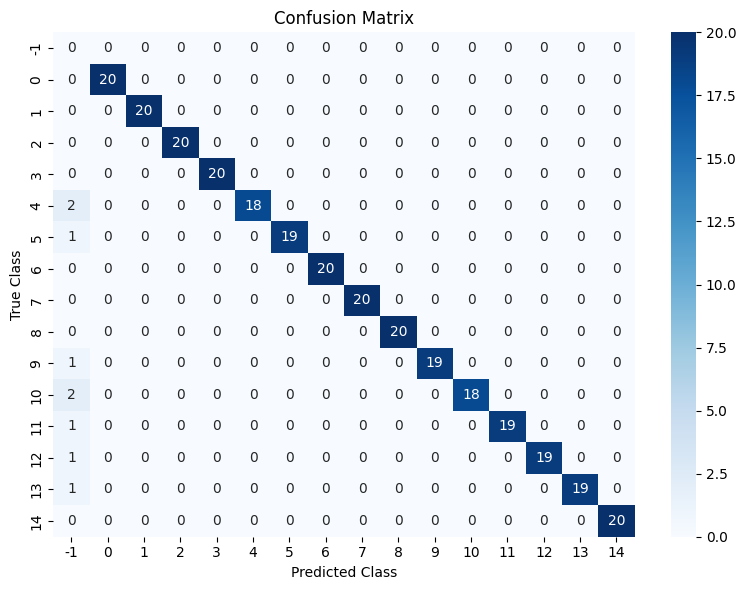

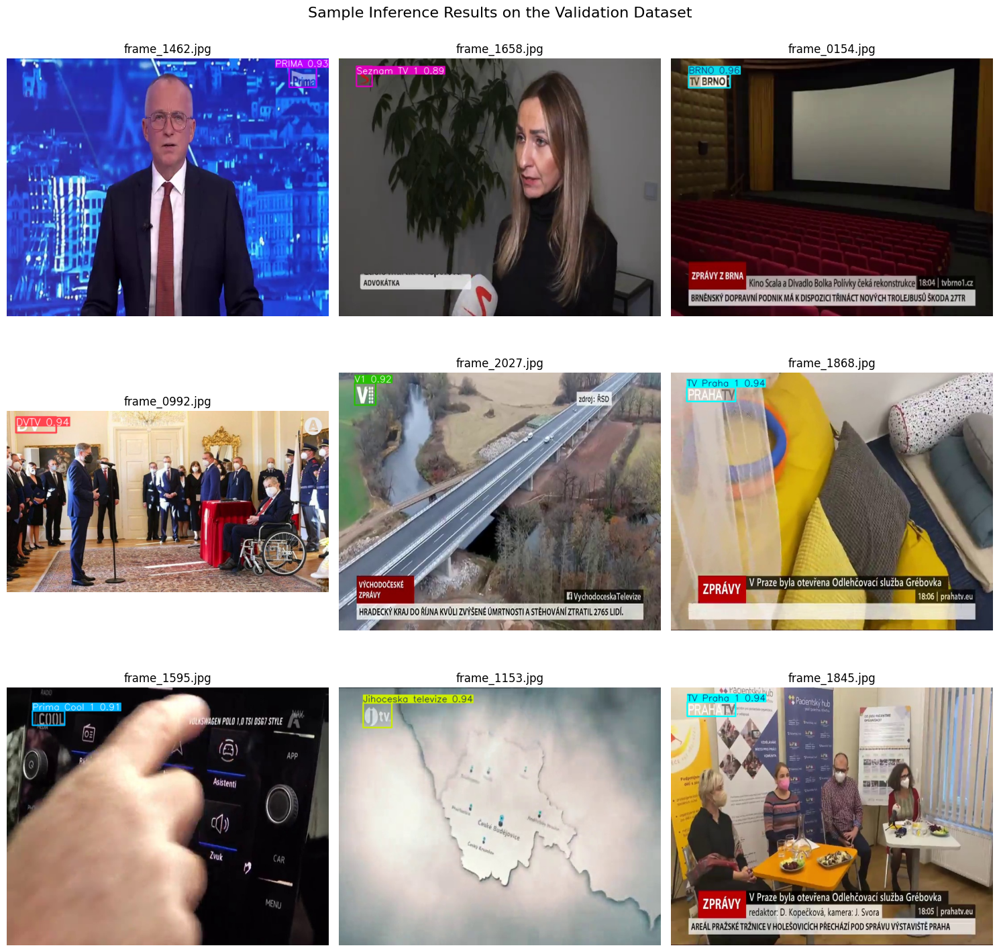

In [55]:
%matplotlib inline
import os
import glob
import random
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, classification_report
from IPython.display import display
import logging
1
from contextlib import redirect_stdout
logging.getLogger("ultralytics").setLevel(logging.ERROR)
# ----- Set Paths -----
val_img_dir = "datasets/dataset/images/val"
val_label_dir = "datasets/dataset/labels/val"

# Get list of all image files in the validation folder (adjust extension filters as needed)
img_files = glob.glob(os.path.join(val_img_dir, "*.*"))

# Lists to store ground truth and predicted classes
y_true = []
y_pred = []

# Loop through each validation image
for img_file in img_files:
    if ".npy" in img_file:
        continue
    # Construct the corresponding label file path (assumes same base name and .txt extension)
    base_name = os.path.splitext(os.path.basename(img_file))[0]
    label_file = os.path.join(val_label_dir, base_name + ".txt")
    
    # Read the ground truth class from the label file (assumes first token is the class index)
    if os.path.exists(label_file):
        with open(label_file, "r") as f:
            line = f.readline().strip()
            if line:
                gt_class = int(line.split()[0])
            else:
                continue  # Skip if label file is empty
    else:
        continue  # Skip if no label file is found

    # Run inference on the image
    with open(os.devnull, 'w') as devnull:
        with redirect_stdout(devnull):
            results = model.predict(source=img_file, conf=0.25, imgsz=640, verbose=False)
    
    # If no detection is found, assign a special label (-1)
    if len(results) == 0 or results[0].boxes is None or len(results[0].boxes.data) == 0:
        pred_class = -1
    else:
        boxes = results[0].boxes
        confs = boxes.conf.cpu().numpy()
        classes = boxes.cls.cpu().numpy()
        if len(confs) > 0:
            # Choose the detection with the highest confidence
            idx = np.argmax(confs)
            pred_class = int(classes[idx])
        else:
            pred_class = -1

    y_true.append(gt_class)
    y_pred.append(pred_class)

# Filter out no-detections (-1) if desired; here we include them for full evaluation
all_classes = sorted(list(set(y_true + y_pred)))
# You can exclude -1 by uncommenting the following two lines:
# all_classes = sorted(list(set(y_true + y_pred) - {-1}))
# y_true, y_pred = zip(*[(t, p) for t, p in zip(y_true, y_pred) if p != -1])

# Compute confusion matrix and classification report
cm = confusion_matrix(y_true, y_pred, labels=all_classes)
print("Confusion Matrix:")
print(cm)
print("\nClassification Report:")
print(classification_report(y_true, y_pred, labels=all_classes, zero_division=0))

# Plot the confusion matrix using seaborn
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", 
            xticklabels=all_classes, yticklabels=all_classes)
plt.xlabel("Predicted Class")
plt.ylabel("True Class")
plt.title("Confusion Matrix")
plt.tight_layout()
plt.show()

# ----- Display Sample Annotated Images from the Validation Dataset -----
# Run inference on the entire validation dataset
val_results = model.predict(source=val_img_dir, conf=0.25, imgsz=640)

# Sample up to 9 results for visualization
sample_size = min(9, len(val_results))
sample_results = random.sample(list(val_results), sample_size)

# Create a 3x3 grid for display
fig, axes = plt.subplots(3, 3, figsize=(15, 15))
axes = axes.flatten()
for ax, res in zip(axes, sample_results):
    annotated_img = res.plot()  # returns annotated image as a BGR numpy array
    annotated_img_rgb = annotated_img[..., ::-1]  # convert BGR to RGB
    title = os.path.basename(res.path) if hasattr(res, "path") else "Image"
    ax.imshow(annotated_img_rgb)
    ax.set_title(title)
    ax.axis("off")
plt.suptitle("Sample Inference Results on the Validation Dataset", fontsize=16)
plt.tight_layout()
plt.show()

In [51]:
plt.show()

# Extended Training on the Smallest Model
Once you’ve confirmed everything works, you can train the model for more epochs (e.g., 50 epochs) to improve performance. This cell continues training using the same model.

In [44]:
# Continue training the same YOLOv8n model for more epochs
model.train(
    data="dataset.yaml",
    epochs=10,            # Extended number of epochs
    imgsz=640,
    batch=16,
    # Optionally, add resume=True if you want to continue from the previous checkpoint
    # resume=True
)

train: Scanning /data/notebook_files/datasets/dataset/labels/train.cache... 1200 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1200/1200 [00:00<?, ?it/s]
val: Scanning /data/notebook_files/datasets/dataset/labels/val.cache... 300 images, 0 backgrounds, 0 corrupt: 100%|██████████| 300/300 [00:00<?, ?it/s]
       1/10       4.2G      1.632      4.981      1.425         15        640: 100%|██████████| 75/75 [01:01<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:00<00:00, 10.43it/s]
       2/10      4.47G      0.992      2.473      1.072         16        640: 100%|██████████| 75/75 [00:16<00:00,  4.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  9.08it/s]
       3/10      4.51G     0.8398      1.914     0.9907         13        640: 100%|██████████| 75/75 [00:13<00:00,  5.50it/s]
                 Class     Image

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x724681306e00>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,   

# Evaluation and Loss Analysis
This cell performs a full evaluation on your validation dataset and prints out the metrics. It also re-plots the loss curves and evaluation stats for a comprehensive look at your model’s performance.

In [37]:
# Evaluate the model on the validation dataset to compute metrics such as loss and mAP
metrics = model.val(data="dataset.yaml")
print("Evaluation metrics:", metrics)

# Plot the training and validation curves for further analysis
model.plot()  # Displays loss, accuracy, mAP curves, etc.

Evaluation metrics: ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x72464802bc10>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043

val: Scanning /data/notebook_files/datasets/dataset/labels/val.cache... 300 images, 0 backgrounds, 0 corrupt: 100%|██████████| 300/300 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:02<00:00,  8.52it/s]


AttributeError: AttributeError: 'DetectionModel' object has no attribute 'plot'

# Data Augmentation

In [ ]:
!pip install albumentations

In [53]:
import os
import random
import cv2
import albumentations as A
import matplotlib.pyplot as plt

# ----- Setup Directories -----
train_img_dir = "datasets/dataset/images/train"
train_label_dir = "datasets/dataset/labels/train"

aug_img_dir = "datasets/augmented/images/train"
aug_label_dir = "datasets/augmented/labels/train"
os.makedirs(aug_img_dir, exist_ok=True)
os.makedirs(aug_label_dir, exist_ok=True)

# ----- Define Albumentations Pipeline with Bounding Box Params -----
# We use 'yolo' format for bounding boxes: [x_center, y_center, width, height] (all normalized)
transform = A.Compose([
    A.HorizontalFlip(p=0.5),
    A.RandomBrightnessContrast(p=0.3),
    A.ShiftScaleRotate(shift_limit=0.1, scale_limit=0.2, rotate_limit=30,
                       border_mode=cv2.BORDER_REFLECT, p=0.5),
    A.HueSaturationValue(hue_shift_limit=20, sat_shift_limit=30, val_shift_limit=20, p=0.5),
    A.RandomSizedCrop(min_max_height=(400, 640), height=640, width=640, p=0.5)
], bbox_params=A.BboxParams(format='yolo', min_visibility=0.1, label_fields=['class_labels']))

# ----- Get List of Training Images -----
img_files = [f for f in os.listdir(train_img_dir) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]

# Process a sample of 10 images (or all if fewer)
sample_files = random.sample(img_files, min(10, len(img_files)))

for img_file in sample_files:
    img_path = os.path.join(train_img_dir, img_file)
    label_path = os.path.join(train_label_dir, os.path.splitext(img_file)[0] + ".txt")
    
    # Read the image (Albumentations expects images in uint8, in BGR order)
    image = cv2.imread(img_path)
    if image is None:
        continue  # Skip if image reading fails
    # Convert to RGB for our augmentation display (Albumentations works fine with either, but for consistency we'll use RGB)
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    
    # Parse the label file into a list of bounding boxes and corresponding class labels
    bboxes = []
    class_labels = []
    if os.path.exists(label_path):
        with open(label_path, 'r') as f:
            for line in f:
                parts = line.strip().split()
                if len(parts) == 5:
                    cls_id = int(parts[0])
                    bbox = [float(x) for x in parts[1:]]  # [x_center, y_center, width, height]
                    bboxes.append(bbox)
                    class_labels.append(cls_id)
    # If no label file or no bounding boxes, use empty lists (augmentation will only affect the image)
    
    # Apply the augmentation pipeline
    augmented = transform(image=image_rgb, bboxes=bboxes, class_labels=class_labels)
    aug_img = augmented["image"]
    aug_bboxes = augmented["bboxes"]
    aug_class_labels = augmented["class_labels"]
    
    # Save augmented image: Convert back to BGR for cv2.imwrite
    aug_img_bgr = cv2.cvtColor(aug_img, cv2.COLOR_RGB2BGR)
    out_img_path = os.path.join(aug_img_dir, "aug_" + img_file)
    cv2.imwrite(out_img_path, aug_img_bgr)
    
    # Save new label file in YOLO format
    out_label_path = os.path.join(aug_label_dir, os.path.splitext(img_file)[0] + ".txt")
    with open(out_label_path, 'w') as f:
        for cls_id, bbox in zip(aug_class_labels, aug_bboxes):
            # Format each bbox to six decimals
            bbox_str = " ".join(f"{x:.6f}" for x in bbox)
            f.write(f"{cls_id} {bbox_str}\n")

# ----- Display Sample Original vs. Augmented Images -----
fig, axes = plt.subplots(2, len(sample_files), figsize=(15, 8))
for i, img_file in enumerate(sample_files):
    orig_img = cv2.imread(os.path.join(train_img_dir, img_file))
    orig_img_rgb = cv2.cvtColor(orig_img, cv2.COLOR_BGR2RGB)
    aug_img = cv2.imread(os.path.join(aug_img_dir, "aug_" + img_file))
    aug_img_rgb = cv2.cvtColor(aug_img, cv2.COLOR_BGR2RGB)
    
    axes[0, i].imshow(orig_img_rgb)
    axes[0, i].set_title(f"Original\n{img_file}")
    axes[0, i].axis("off")
    
    axes[1, i].imshow(aug_img_rgb)
    axes[1, i].set_title("Augmented")
    axes[1, i].axis("off")
    
plt.tight_layout()
plt.show()

KeyError: KeyError: 'instances'

# Presentation

In [70]:
!pip install pandas


[notice] A new release of pip is available: 23.1.2 -> 25.0.1
[notice] To update, run: pip install --upgrade pip


In [72]:
import pandas as pd

def get_best_accuracy(file_path):
    """
    Loads a Pandas DataFrame from a .csv file and returns the best mAP value (from column 'metrics/mAP50-95(B)')
    and the corresponding row(s). Higher mAP indicates better performance.
    
    Parameters:
        file_path (str): Path to the CSV file.
    
    Returns:
        tuple: A tuple (best_map, best_row) where:
            - best_map (float): The maximum mAP value.
            - best_row (DataFrame): The DataFrame row(s) with that maximum mAP value.
    
    Raises:
        KeyError: If the required column is not found in the DataFrame.
    """
    # Load the CSV into a DataFrame
    df = pd.read_csv(file_path)
    
    # Ensure the required column exists
    col_name = 'metrics/mAP50-95(B)'
    if col_name not in df.columns:
        raise KeyError(f"Column '{col_name}' not found in the CSV file.")
    
    # Find the maximum mAP value in the column
    best_map = df[col_name].max()
    
    # Extract the row(s) where the mAP is equal to the best value
    best_row = df[df[col_name] == best_map]
    
    return best_map, best_row

# Example usage:
# best_map, best_row = get_best_accuracy("path/to/your/results.csv")
# print("Best mAP50-95(B):", best_map)
# print("Row(s) with best mAP50-95(B):")
# print(best_row)

In [76]:
folders_names = [
  "train5m",
  "train6",
  "train6n",
  "train7",
  "train7s",
  "train8",
]

files = [f"runs/detect/{folder_name}/results.csv" for folder_name in folders_names]
best_dict =[]
for name,file_name in zip(folders_names,files):
    best_accuracy,epoch = get_best_accuracy(file_name)
    
    best_dict.append({
        "name":name,
        "score":best_accuracy
    })
for i in best_dict:
    print(i)

{'name': 'train5m', 'score': 0.95903}
{'name': 'train6', 'score': 0.94436}
{'name': 'train6n', 'score': 0.91352}
{'name': 'train7', 'score': 0.96885}
{'name': 'train7s', 'score': 0.95014}
{'name': 'train8', 'score': 0.97306}


In [77]:
folder = "presentation_images"
# bases are yolo11n, yolo11s and yolo11m

#confusion matrixes are squares, they are fine

confusion_matrixes_15_epochs = [
    "confusion_matrix_n.png",
    "confusion_matrix_s.png",
    "confusion_matrix_m.png"
]
# metrics are wide rectangle so do not place them next to each other
metrics_15_epochs = [
    "results-n.png",
    "results-s.png",
    "results-m.png"
]
best_mAP50_95_15 = [
    0.91352,
    0.95014,
    0.95903

]

precision_recall_mAP50_95_15= [
    [0.98111, 0.94554, 0.91352] #n
    [0.983,0.97264,0.94812], #s
    [0.99241, 0.97767, 0.95903] #m
]

#confusion matrixes are squares, they are fine

confusion_matrixes_50_epochs = [
    "confusion_matrix_n50.png",
    "confusion_matrix_s50.png",
    "confusion_matrix_m50.png"
]
# metrics are wide rectangle so do not place them next to each other
metrics_50_epochs = [
    "results-n50.png",
    "results-s50.png",
    "results-m50.png"
]
best_mAP50_95_15 = [
    0.94436, # n
    0.96885, # s
    0.97306 # m
]
precision_recall_mAP50_95_50= [
    [0.98574,0.97265,0.94291], #n
    [0.98434, 0.9858,0.96885], #s
    [0.98361,0.97773,0.9725] #m

]

augmentation_example = "augmentation.jpg" # just example, is not linked with any of the models
prediction_result = "prediction.png" # just example, is not linked with any of the models

SyntaxError: SyntaxError: invalid syntax

# YOLO Model Training Summary

This README provides an overview of the training process for YOLO models (n, s, m) at 15 and 50 epochs. The results include confusion matrices, performance metrics, and key evaluation values.

## Training Setup
- Models trained: YOLO n, YOLO s, YOLO m
- Training durations: 15 epochs and 50 epochs
- Evaluation metrics: mAP@50-95, Precision, Recall

## Results for 15 Epochs
### Confusion Matrices
Below are the confusion matrices for each model trained for 15 epochs:

| Model | Confusion Matrix |
|--------|-----------------|
| YOLO-n | 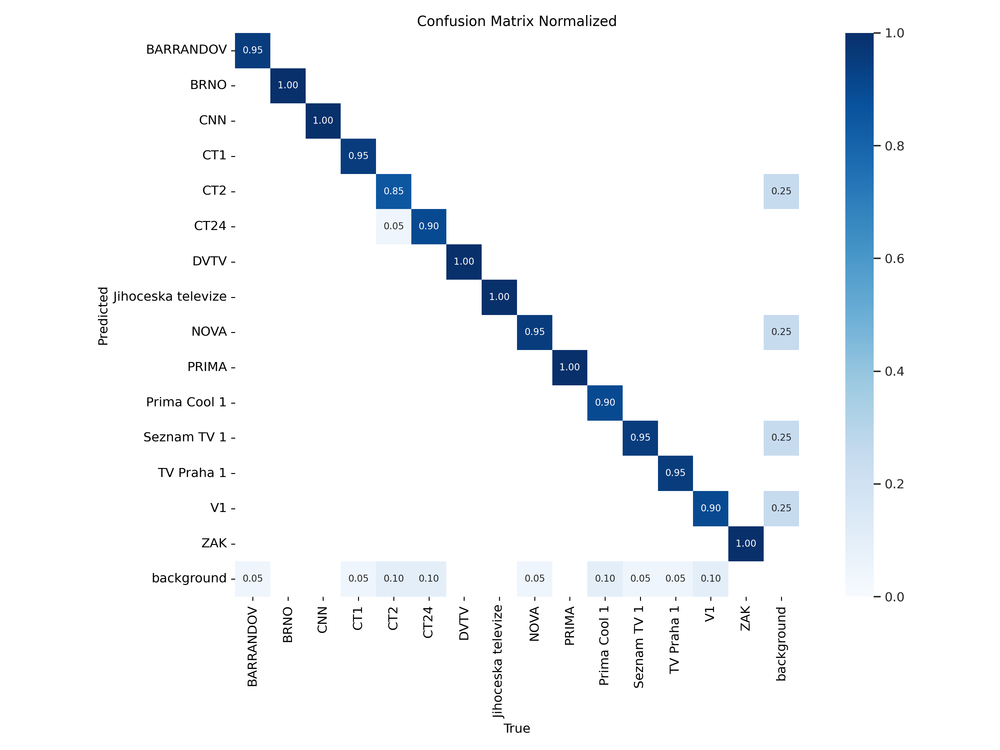 |
| YOLO-s | 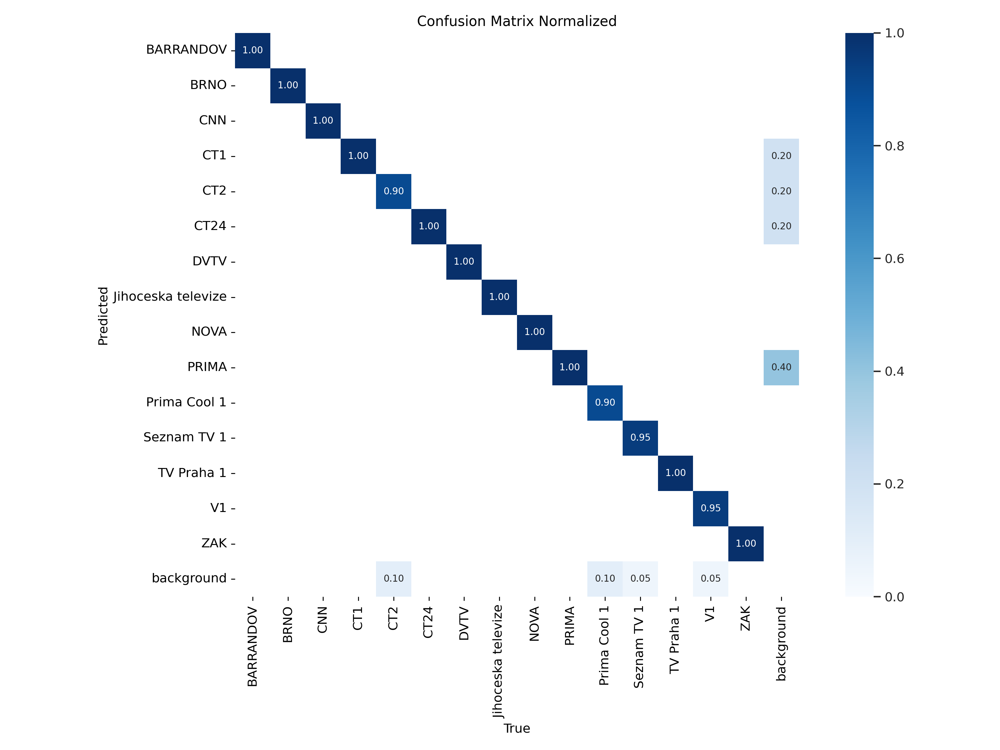 |
| YOLO-m | 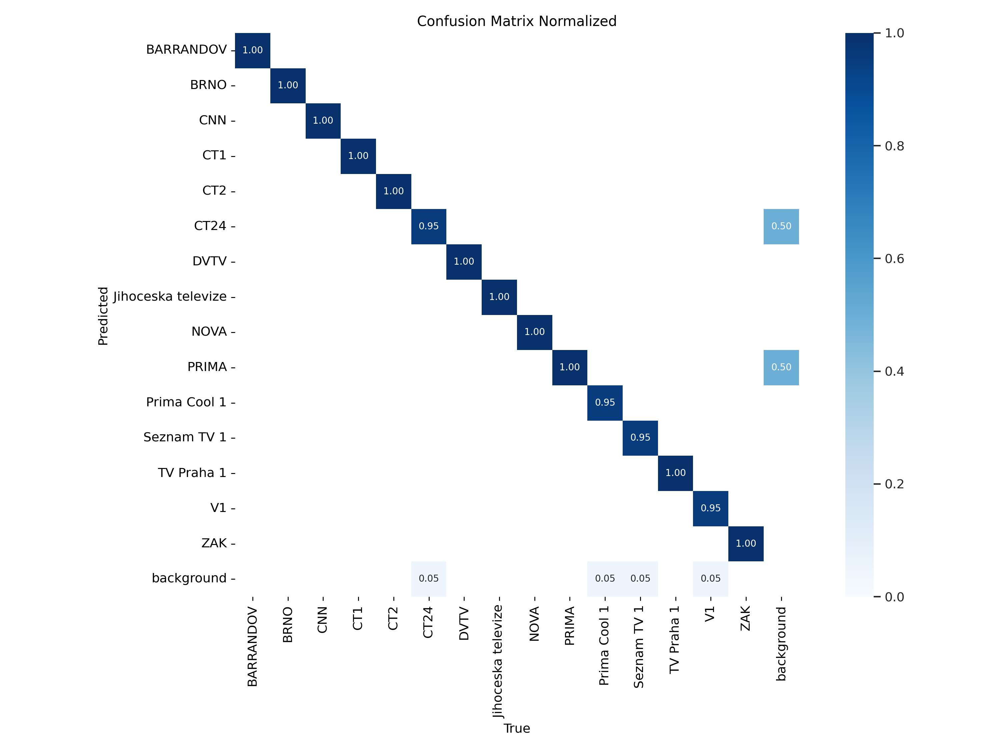 |

### Metrics
Performance metrics for each model trained for 15 epochs:

| Model | Metrics |
|--------|---------|
| YOLO-n | 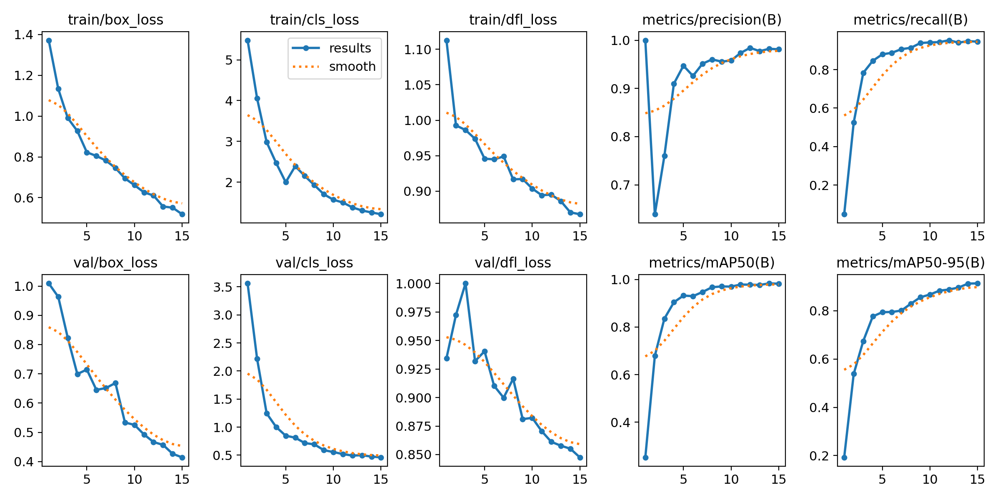 |
| YOLO-s | 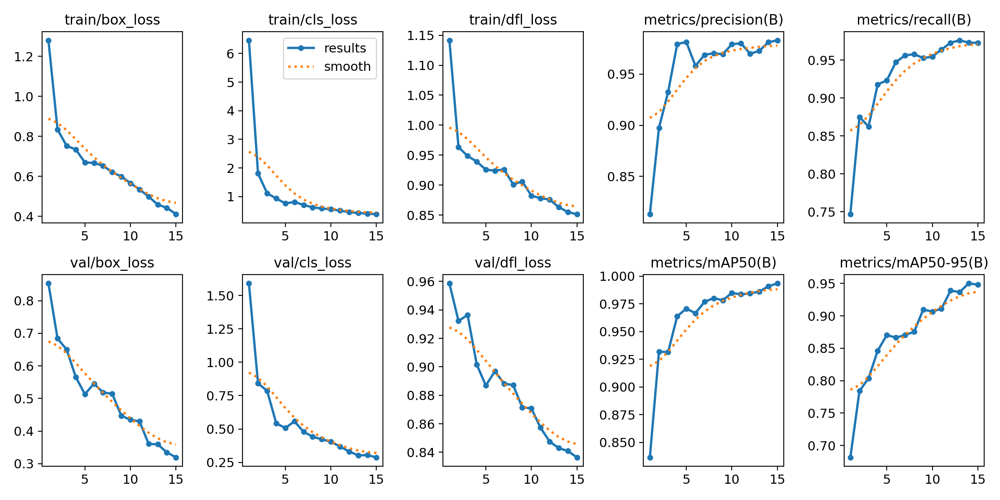 |
| YOLO-m | 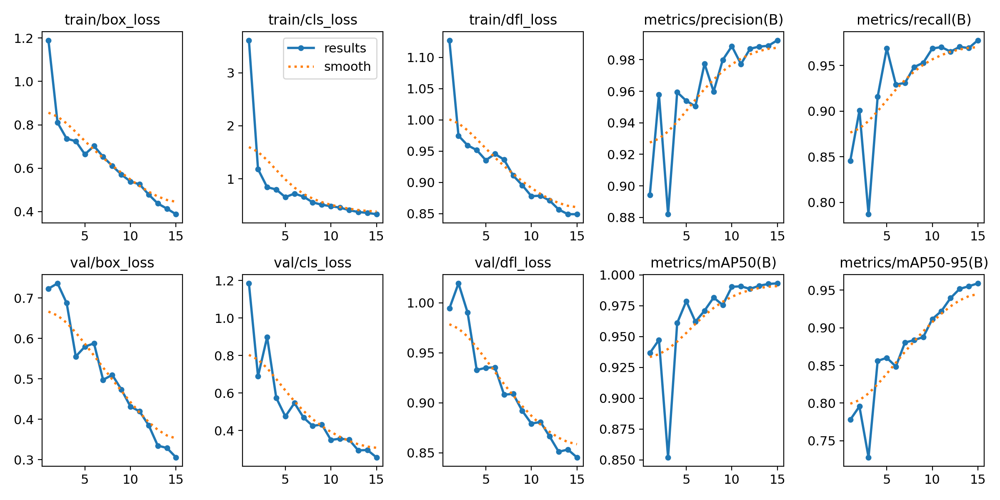 |

### Best mAP@50-95 Scores
| Model  | Best mAP@50-95 |
|--------|--------------|
| YOLO-n | 0.91352      |
| YOLO-s | 0.95014      |
| YOLO-m | 0.95903      |

### Precision, Recall, mAP@50-95
| Model  | Precision | Recall | mAP@50-95 |
|--------|-----------|--------|-----------|
| YOLO-n | 0.98111   | 0.94554 | 0.91352   |
| YOLO-s | 0.98300   | 0.97264 | 0.94812   |
| YOLO-m | 0.99241   | 0.97767 | 0.95903   |

---

## Results for 50 Epochs
### Confusion Matrices
Below are the confusion matrices for each model trained for 50 epochs:

| Model | Confusion Matrix |
|--------|-----------------|
| YOLO-n | 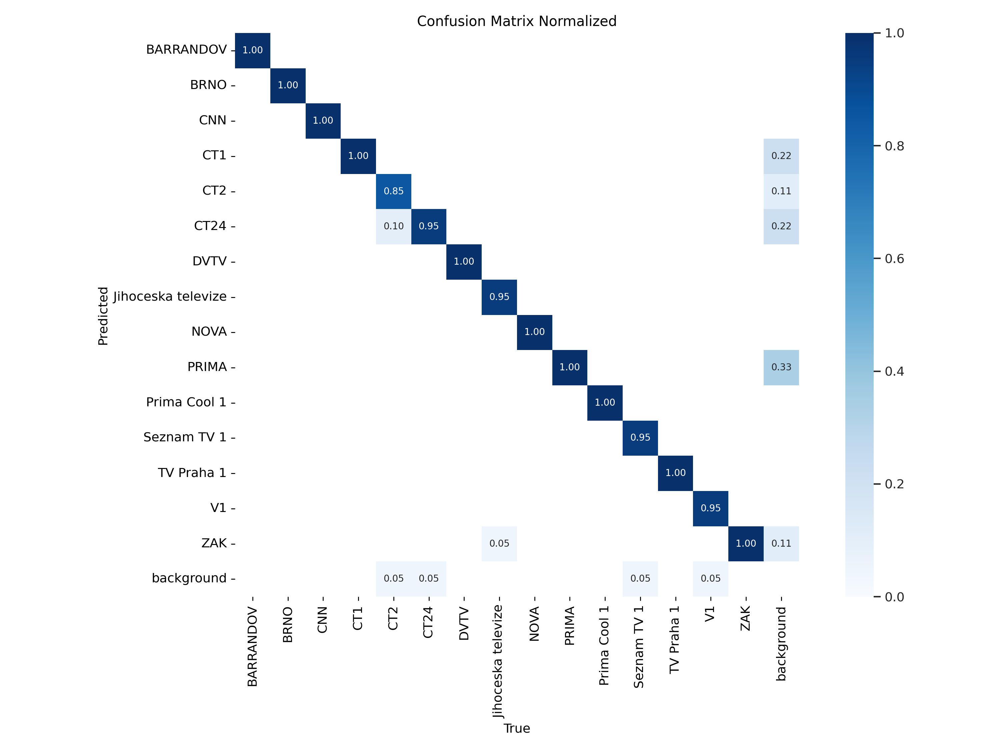 |
| YOLO-s | 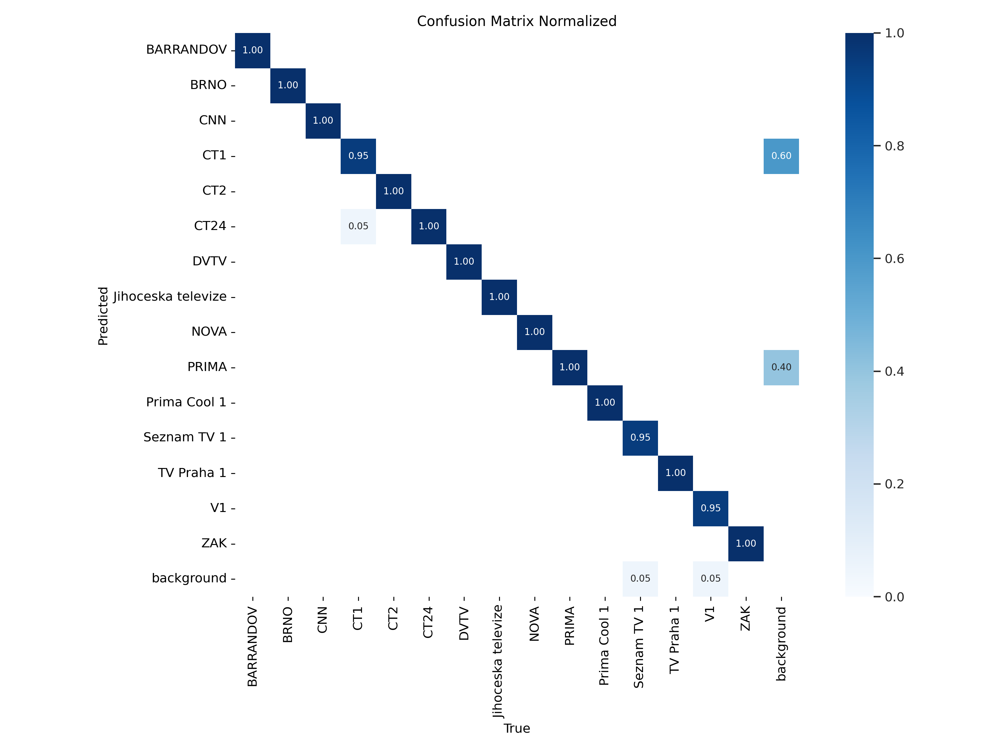 |
| YOLO-m | 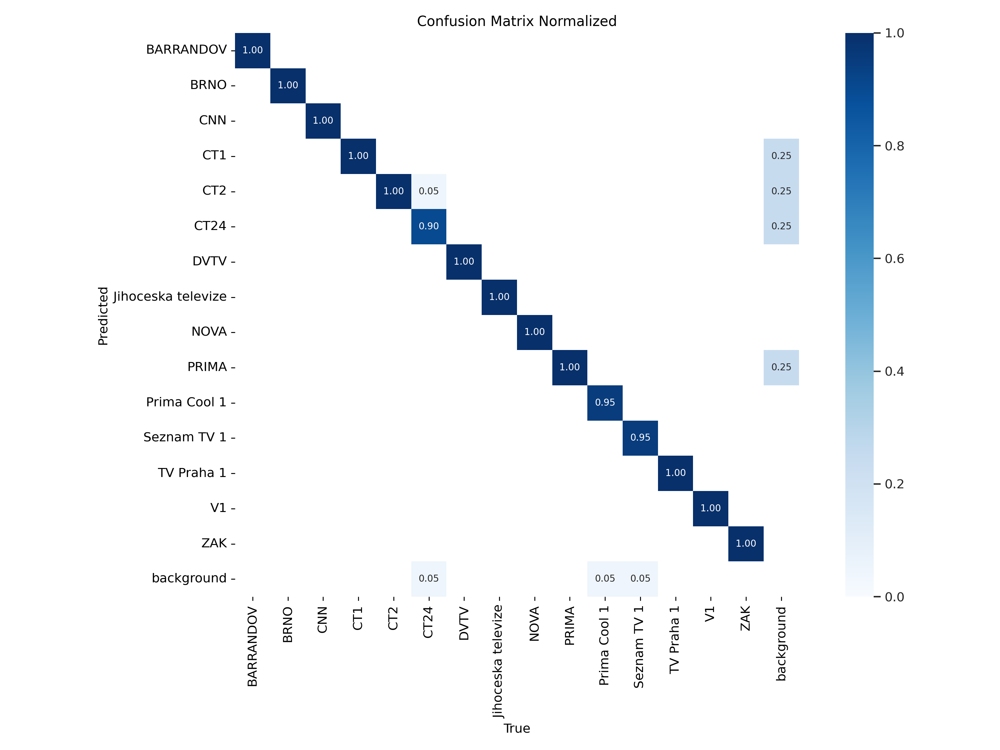 |

### Metrics
Performance metrics for each model trained for 50 epochs:

| Model | Metrics |
|--------|---------|
| YOLO-n | 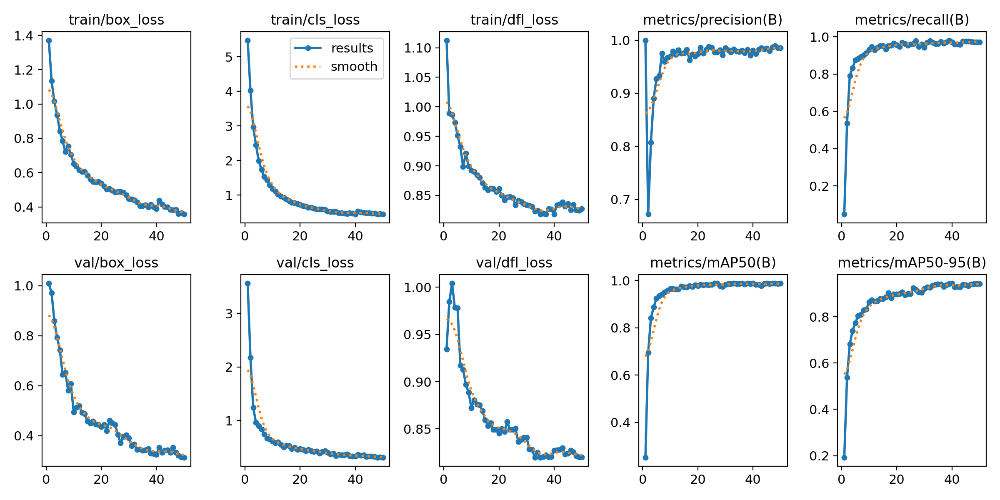 |
| YOLO-s | 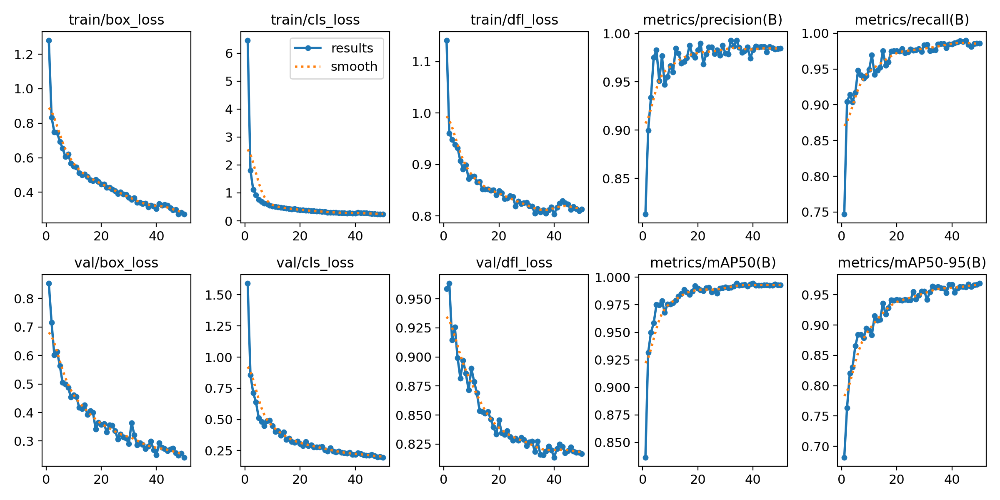 |
| YOLO-m | 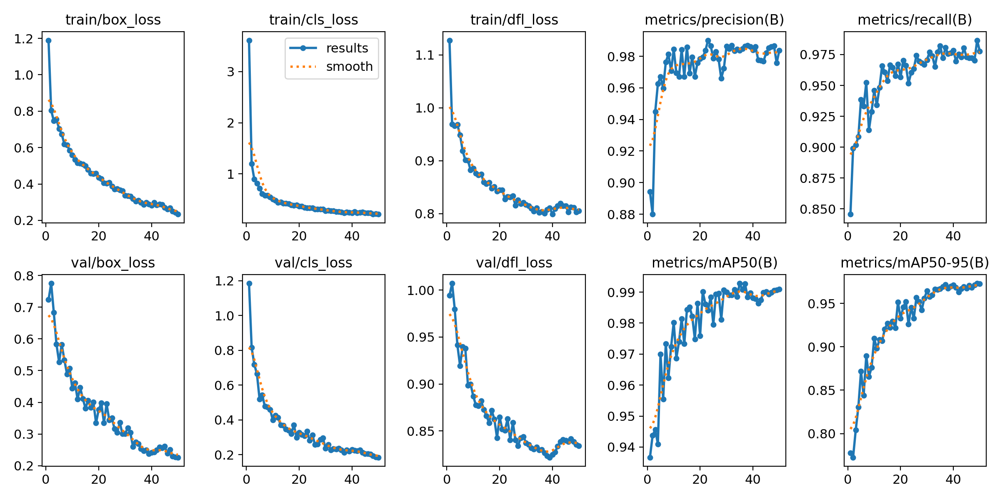 |

### Best mAP@50-95 Scores
| Model  | Best mAP@50-95 |
|--------|--------------|
| YOLO-n | 0.94436      |
| YOLO-s | 0.96885      |
| YOLO-m | 0.97306      |

### Precision, Recall, mAP@50-95
| Model  | Precision | Recall | mAP@50-95 |
|--------|-----------|--------|-----------|
| YOLO-n | 0.98574   | 0.97265 | 0.94291   |
| YOLO-s | 0.98434   | 0.98580 | 0.96885   |
| YOLO-m | 0.98361   | 0.97773 | 0.97250   |

---

## Additional Information
- **Augmentation Example:**
  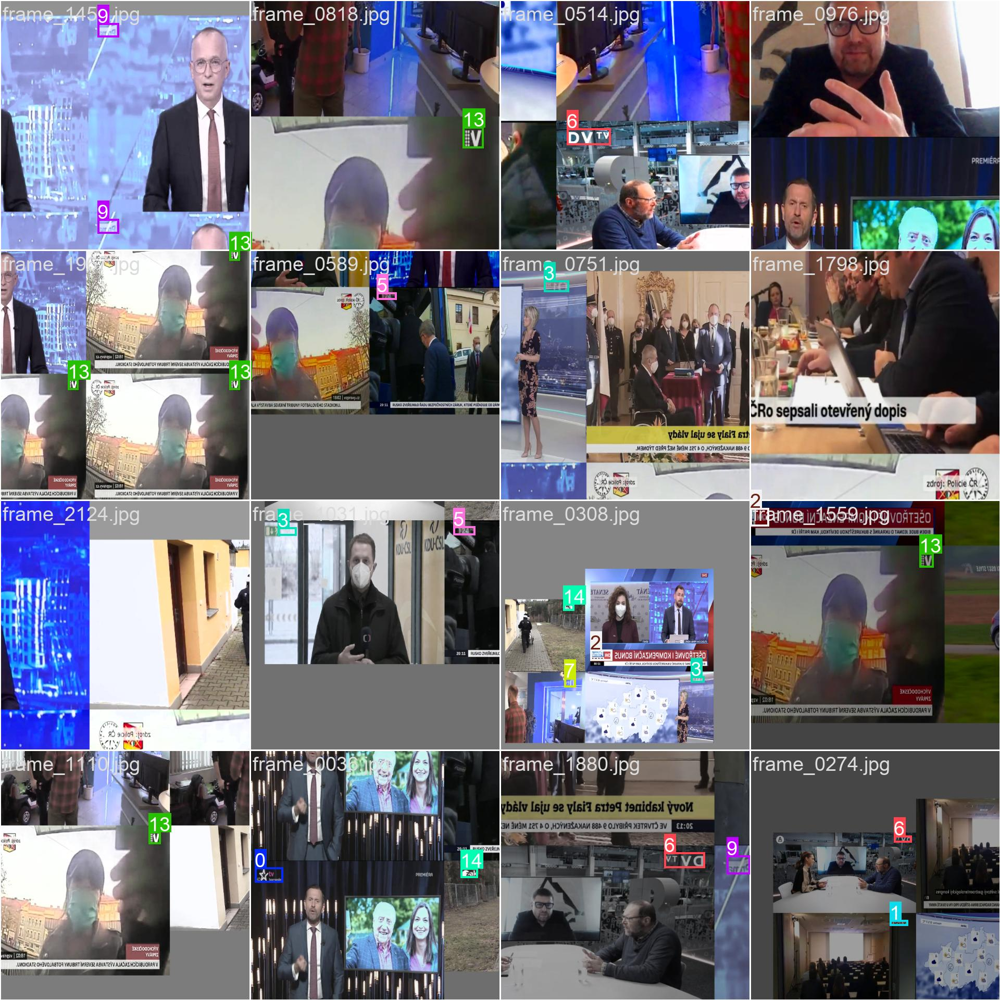
- **Prediction Result Example:**
  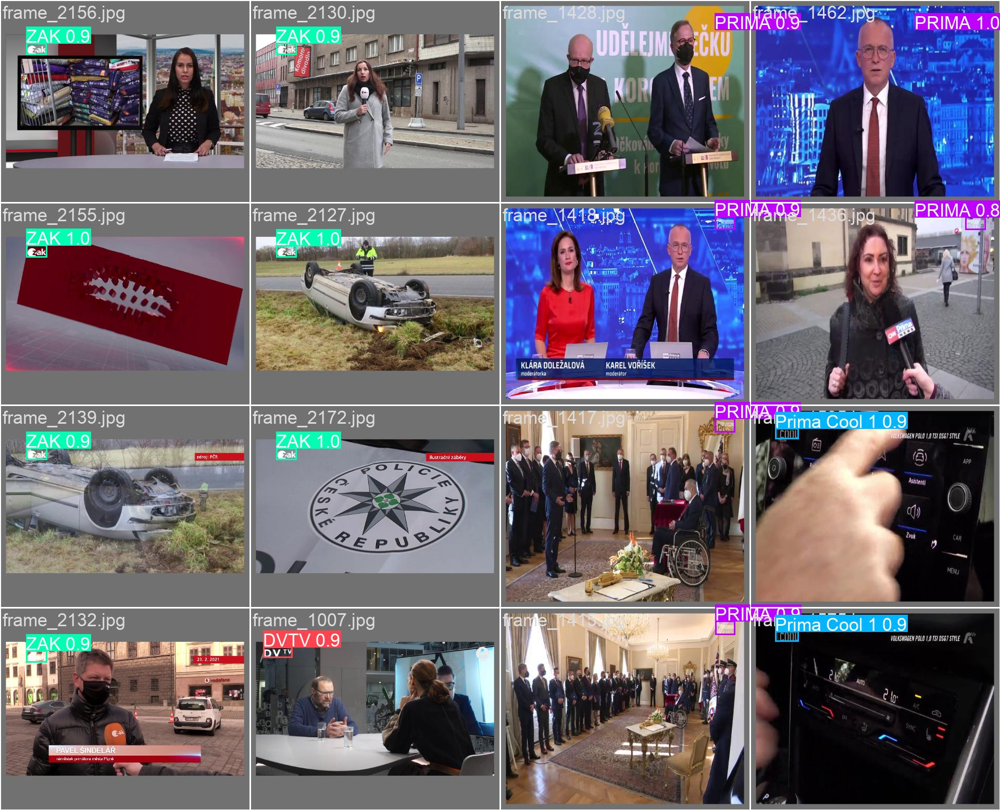
